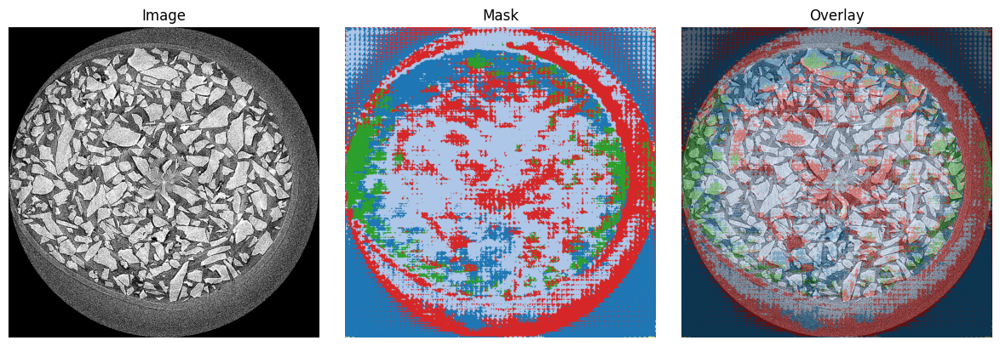

In [4]:
import lightly_train
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import os
os.environ["LIGHTLY_TRAIN_CACHE_DIR"] = "./.cache"
os.environ["LIGHTLY_TRAIN_MODEL_CACHE_DIR"] = "./.cache"

IMG_PATH = "./20240425_153137_nist-sand-100-325_27keV_z8mm_n2625_00000.png"

# ------------------------
# Load pretrained Lightly model
# ------------------------
model = lightly_train.load_model(
    model="dinov3/vitl16-eomt-cityscapes"
   
)
model.eval()

# ------------------------
# Predict
# ------------------------
with torch.inference_mode():
    mask = model.predict(IMG_PATH)

# Convert mask safely
if isinstance(mask, torch.Tensor):
    mask = mask.detach().cpu().numpy()

# Load image
img = Image.open(IMG_PATH).convert("RGB")
img_np = np.array(img)

# Plot
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(img_np)
plt.axis("off")
plt.title("Image")

plt.subplot(1, 3, 2)
plt.imshow(mask, cmap="tab20")
plt.axis("off")
plt.title("Mask")

plt.subplot(1, 3, 3)
plt.imshow(img_np)
plt.imshow(mask, cmap="tab20", alpha=0.45)
plt.axis("off")
plt.title("Overlay")

plt.tight_layout()
plt.show()


/pscratch/sd/x/xchong/envs/lightly/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


20240425_112716_nist-sand-30-100_27keV_z8mm_n2625_00000.png | classes: [0 1 2]


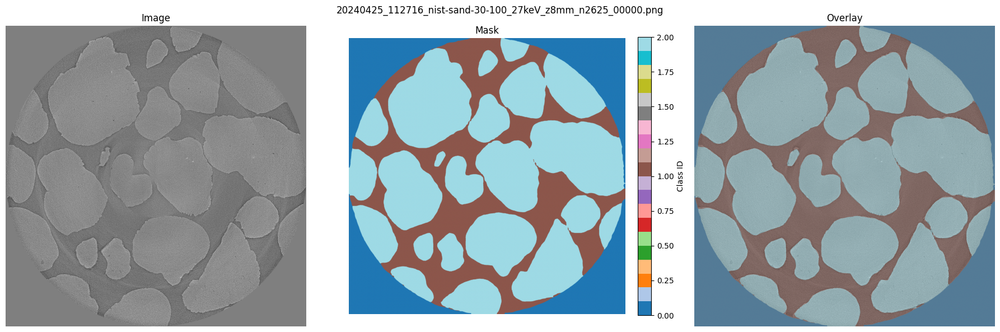

20240425_161650_nist-sand-30-200-mix_27keV_z8mm_n2625_01008.png | classes: [0 1 2]


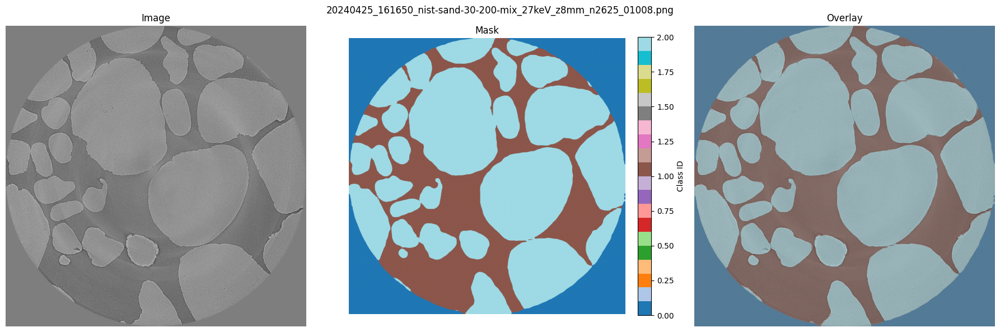

20240425_161650_nist-sand-30-200-mix_27keV_z8mm_n2625_02088.png | classes: [0 1 2]


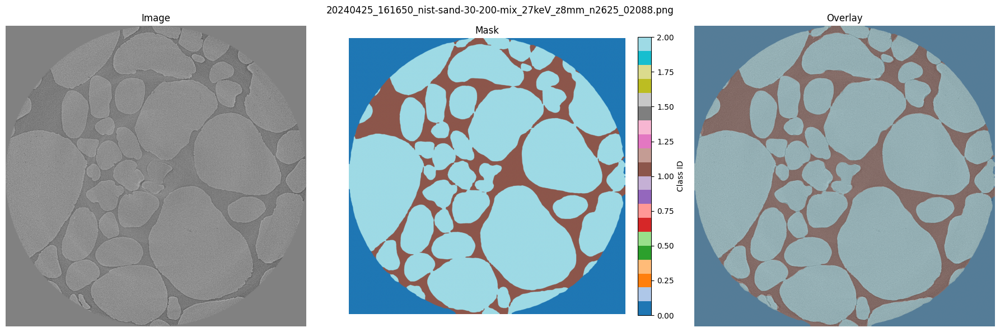

HEX_scan_00220_01600.png | classes: [0 1 2]


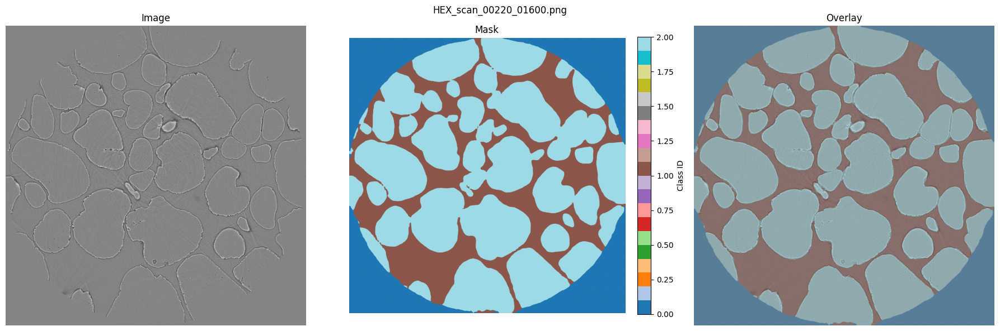

HEX_scan_00220_03199.png | classes: [0 1 2]


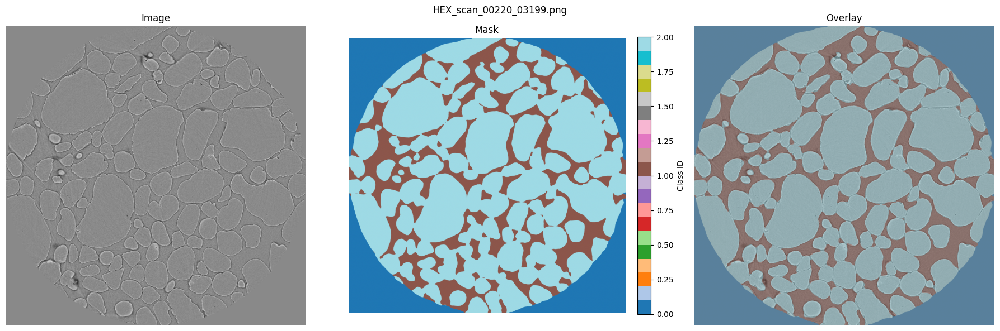

Savu_k11-38727_full_fd_vo_AST_tiff_00000.png | classes: [0 1 2]


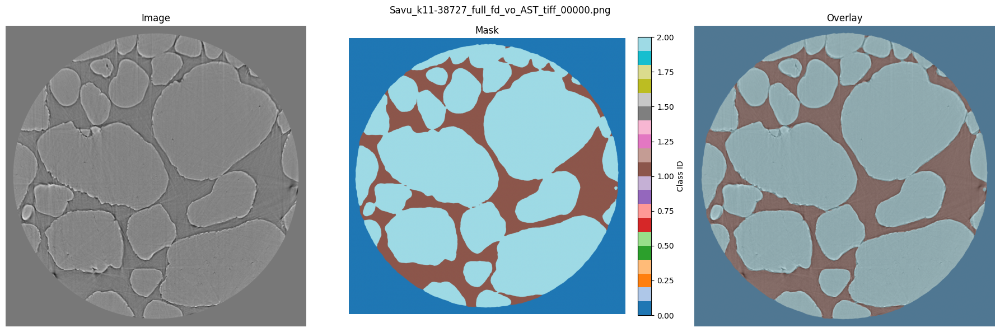

sand4_recon_01212.png | classes: [0 1 2 3]


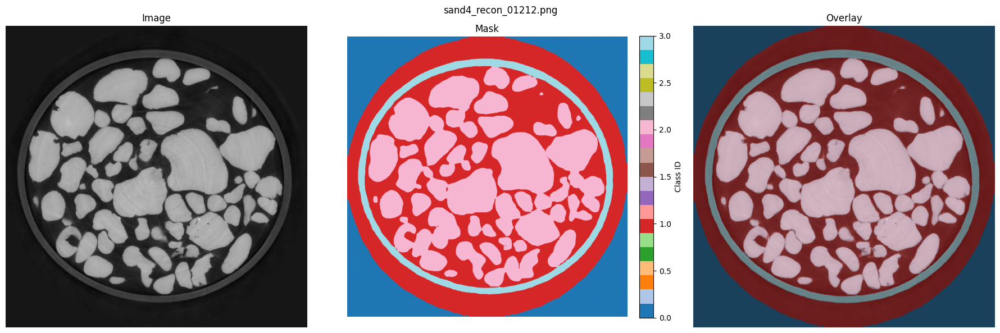

In [1]:
import lightly_train
import torch
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image

# ------------------------
# Paths
# ------------------------
IMG_DIR = Path("/pscratch/sd/x/xchong/lightly/sand_data_seg_png/val/images")
CKPT_PATH = "/pscratch/sd/x/xchong/lightly/out_slurm_vits16/my_experiment/checkpoints/best.ckpt"

# ------------------------
# Load model
# ------------------------
model = lightly_train.load_model(CKPT_PATH)
model.eval()

# ------------------------
# Supported image formats
# ------------------------
IMG_EXTS = {".png", ".jpg", ".jpeg", ".tif", ".tiff"}

# ------------------------
# Inference + plot loop
# ------------------------
with torch.inference_mode():
    for img_path in sorted(IMG_DIR.iterdir()):
        if img_path.suffix.lower() not in IMG_EXTS:
            continue

        # Load image
        img = Image.open(img_path).convert("RGB")
        img_np = np.array(img)

        # Predict mask
        mask = model.predict(str(img_path))

        # Convert mask safely
        if isinstance(mask, torch.Tensor):
            mask_np = mask.detach().cpu().numpy()
        else:
            mask_np = np.array(mask)

        print(f"{img_path.name} | classes: {np.unique(mask_np)}")

        # ------------------------
        # Plot (ONE ROW)
        # ------------------------
        plt.figure(figsize=(18, 6))

        # Image
        plt.subplot(1, 3, 1)
        plt.imshow(img_np)
        plt.axis("off")
        plt.title("Image")

        # Mask
        plt.subplot(1, 3, 2)
        plt.imshow(mask_np, cmap="tab20")
        plt.colorbar(label="Class ID", fraction=0.046, pad=0.04)
        plt.axis("off")
        plt.title("Mask")

        # Overlay
        plt.subplot(1, 3, 3)
        plt.imshow(img_np)
        plt.imshow(mask_np, cmap="tab20", alpha=0.45)
        plt.axis("off")
        plt.title("Overlay")

        plt.suptitle(img_path.name)
        plt.tight_layout()
        plt.show()


Mask shape: (2560, 2560)
Unique classes: [0 1 2 3]


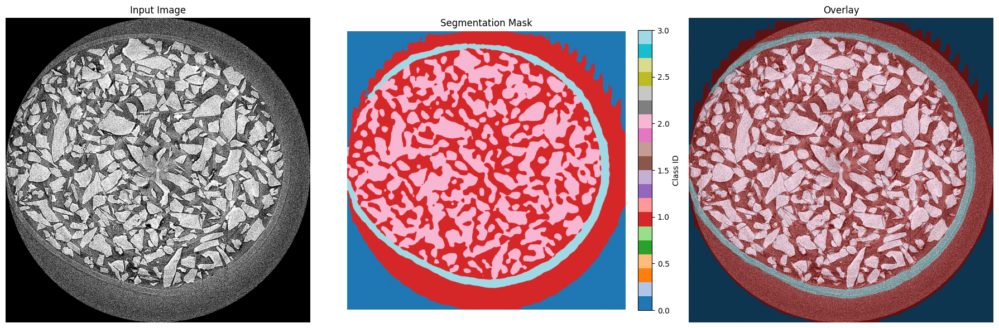

In [2]:
import lightly_train
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# ------------------------
# Paths
# ------------------------
IMG_PATH = "./20240425_153137_nist-sand-100-325_27keV_z8mm_n2625_00000.png"
CKPT_PATH = "/pscratch/sd/x/xchong/lightly/out_slurm_vits16/my_experiment/checkpoints/best.ckpt"

# ------------------------
# Load model
# ------------------------
model = lightly_train.load_model(CKPT_PATH)
model.eval()

# ------------------------
# Predict segmentation mask
# ------------------------
with torch.inference_mode():
    mask = model.predict(IMG_PATH)

# ------------------------
# Convert mask safely (CUDA → CPU → NumPy)
# ------------------------
if isinstance(mask, torch.Tensor):
    mask_np = mask.detach().cpu().numpy()
else:
    mask_np = np.array(mask)

print("Mask shape:", mask_np.shape)
print("Unique classes:", np.unique(mask_np))

# ------------------------
# Load image
# ------------------------
img = Image.open(IMG_PATH).convert("RGB")
img_np = np.array(img)

# ------------------------
# Plot: image | mask | overlay (ONE ROW)
# ------------------------
plt.figure(figsize=(18, 6))

# Image only
plt.subplot(1, 3, 1)
plt.imshow(img_np)
plt.axis("off")
plt.title("Input Image")

# Mask only
plt.subplot(1, 3, 2)
plt.imshow(mask_np, cmap="tab20")
plt.colorbar(label="Class ID", fraction=0.046, pad=0.04)
plt.axis("off")
plt.title("Segmentation Mask")

# Overlay
plt.subplot(1, 3, 3)
plt.imshow(img_np)
plt.imshow(mask_np, cmap="tab20", alpha=0.45)
plt.axis("off")
plt.title("Overlay")

plt.tight_layout()
plt.show()


Mask shape: (2560, 2560)
Unique classes: [0 1 3 4]


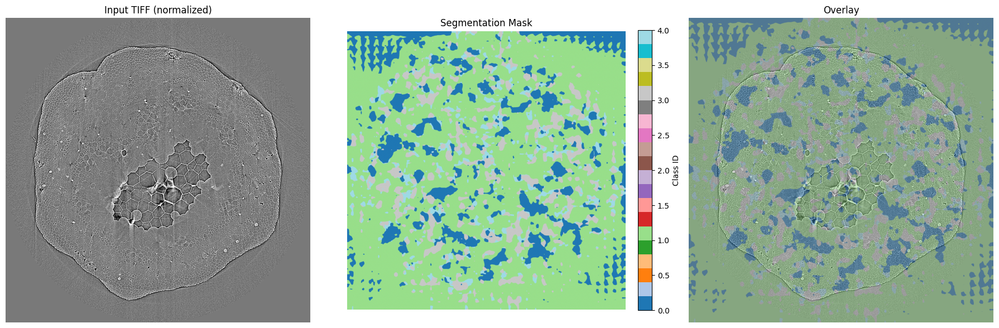

In [3]:
import lightly_train
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# ------------------------
# Paths
# ------------------------
IMG_PATH = "./20211222_125057_petiole4_00000.tiff"
CKPT_PATH = "/pscratch/sd/x/xchong/lightly/out_slurm_vits16/my_experiment/checkpoints/best.ckpt"

# ------------------------
# Load model
# ------------------------
model = lightly_train.load_model(CKPT_PATH)
model.eval()

# ------------------------
# Predict segmentation mask
# ------------------------
with torch.inference_mode():
    mask = model.predict(IMG_PATH)

# ------------------------
# Convert mask safely (CUDA → CPU → NumPy)
# ------------------------
if isinstance(mask, torch.Tensor):
    mask_np = mask.detach().cpu().numpy()
else:
    mask_np = np.array(mask)

print("Mask shape:", mask_np.shape)
print("Unique classes:", np.unique(mask_np))

# ------------------------
# Load TIFF + normalize FOR DISPLAY ONLY
# ------------------------
img = Image.open(IMG_PATH)
img_np = np.array(img).astype(np.float32)

# Percentile normalization (robust for scientific TIFFs)
p1, p99 = np.percentile(img_np, (1, 99))
img_np = np.clip(img_np, p1, p99)
img_np = (img_np - p1) / (p99 - p1 + 1e-8)

# Convert grayscale → RGB
if img_np.ndim == 2:
    img_np = np.stack([img_np] * 3, axis=-1)

# ------------------------
# Plot: image | mask | overlay (ONE ROW)
# ------------------------
plt.figure(figsize=(18, 6))

# Image
plt.subplot(1, 3, 1)
plt.imshow(img_np)
plt.axis("off")
plt.title("Input TIFF (normalized)")

# Mask
plt.subplot(1, 3, 2)
plt.imshow(mask_np, cmap="tab20")
plt.colorbar(label="Class ID", fraction=0.046, pad=0.04)
plt.axis("off")
plt.title("Segmentation Mask")

# Overlay
plt.subplot(1, 3, 3)
plt.imshow(img_np)
plt.imshow(mask_np, cmap="tab20", alpha=0.45)
plt.axis("off")
plt.title("Overlay")

plt.tight_layout()
plt.show()


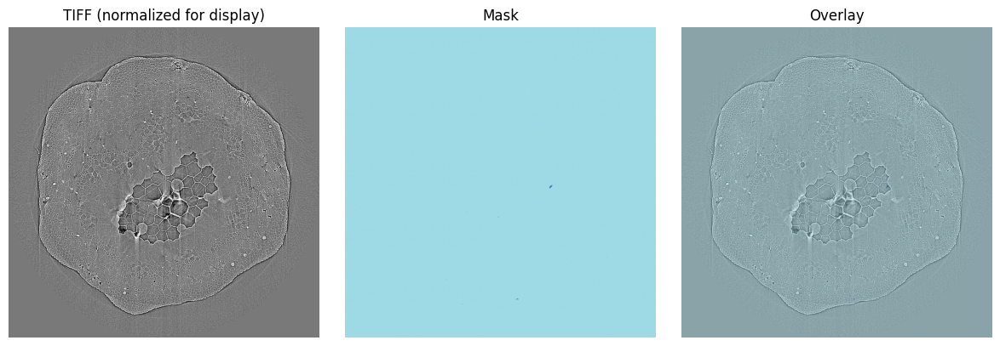

In [5]:
import lightly_train
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os

os.environ["LIGHTLY_TRAIN_CACHE_DIR"] = "./.cache"
os.environ["LIGHTLY_TRAIN_MODEL_CACHE_DIR"] = "./.cache"

IMG_PATH = "./20211222_125057_petiole4_00000.tiff"

# ------------------------
# Load pretrained model
# ------------------------
model = lightly_train.load_model("dinov3/vitl16-eomt-cityscapes")
model.eval()

# ------------------------
# Predict (NO normalization here)
# ------------------------
with torch.inference_mode():
    mask = model.predict(IMG_PATH)

if isinstance(mask, torch.Tensor):
    mask = mask.detach().cpu().numpy()

# ------------------------
# Open TIFF properly (display only)
# ------------------------
img = Image.open(IMG_PATH)
img_np = np.array(img).astype(np.float32)

# Robust normalization for scientific TIFF
p1, p99 = np.percentile(img_np, (1, 99))
img_np = np.clip(img_np, p1, p99)
img_np = (img_np - p1) / (p99 - p1 + 1e-8)

# Grayscale → RGB
if img_np.ndim == 2:
    img_np = np.stack([img_np] * 3, axis=-1)

# ------------------------
# Plot
# ------------------------
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(img_np)
plt.axis("off")
plt.title("TIFF (normalized for display)")

plt.subplot(1, 3, 2)
plt.imshow(mask, cmap="tab20")
plt.axis("off")
plt.title("Mask")

plt.subplot(1, 3, 3)
plt.imshow(img_np)
plt.imshow(mask, cmap="tab20", alpha=0.45)
plt.axis("off")
plt.title("Overlay")

plt.tight_layout()
plt.show()
